In [2]:
#Import packages:
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
from astroquery.mast import Mast
from astroquery.mast import Observations
from ginga.util.zscale import zscale

'''
Ultimately we want to: 
find the image in the file to get the rootname
using the rootname/id wildcard + the filter we want to query the info
filter query info using the mask
x - split the data up but using the file headers? -- call the file using
wildcard info/using root

'''


### Image rootnames chosen for each of the exercises:

* Exercise 1:
    * (i) 'iemg11s5q'
    * (ii) 'iem406a5q'
    * (iii) 'idxr01z3q'
* Exercise 2: 'ie8d01neq'

### Exercise 1.i:

In [59]:
    # Query the data
Ex1_table = Observations.query_criteria(obs_id= 'iemg11*', filters='F814W' ) 
#mask = Ex1_table['obs_id'] == 'iemg11s5q'

Ex1_Prods = Observations.get_product_list(Ex1_table)

Ex1Prod = Observations.filter_products(Ex1_Prods, extension=["_flt.fits", "_raw.fits"] )
mask = Ex1Prod['obs_id'] == 'iemg11s5q'

Ex1Prod[mask]

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level
str8,str3,str5,str37,str64,str1,str69,str9,str28,str11,str1,str7,str19,str5,str52,int64,str8,str6,int64
66994982,HST,image,iemg11s5q,DADS FLT file - Calibrated exposure ACS/WFC3/STIS/COS,S,mast:HST/product/iemg11s5q_flt.fits,SCIENCE,--,FLT,--,CALWF3,3.6.2 (May-27-2021),16579,iemg11s5q_flt.fits,2862720,67172766,PUBLIC,2
66994982,HST,image,iemg11s5q,DADS RAW file - Raw exposure COS/NICMOS/STIS/WFC3/ACS,S,mast:HST/product/iemg11s5q_raw.fits,SCIENCE,--,RAW,--,CALWF3,--,16579,iemg11s5q_raw.fits,590400,67172766,PUBLIC,1


In [55]:
Ex1_table

intentType,obs_collection,provenance_name,instrument_name,project,filters,wavelength_region,target_name,target_classification,obs_id,s_ra,s_dec,dataproduct_type,proposal_pi,calib_level,t_min,t_max,t_exptime,em_min,em_max,obs_title,t_obs_release,proposal_id,proposal_type,sequence_number,s_region,jpegURL,dataURL,dataRights,mtFlag,srcDen,obsid,objID
str7,str3,str6,str9,str3,str5,str7,str4,str23,str9,float64,float64,str5,str18,int64,float64,float64,float64,float64,float64,str27,float64,str5,str8,int64,str275,str34,str35,str6,bool,float64,str8,str9
science,HST,CALWF3,WFC3/UVIS,HST,F814W,Optical,GD71,CALIBRATION;PHOTOMETRIC,iemg110f0,88.1155681444,15.88595614828,image,"Calamida, Annalisa",3,59543.800505439816,59543.8168596875,22.0,702.5,961.2,WFC3 UVIS and IR Photometry,59550.75781241,16579,CAL/WFC3,--,POLYGON 88.11665597 15.88966111 88.11142926 15.88714074 88.11440584 15.88226441 88.114431503615819 15.882276785549836 88.11444601 15.88225302 88.11967264 15.88477332 88.11669614 15.88964973 88.116670471500683 15.889637352862721 88.11665597 15.88966111 88.11665597 15.88966111,mast:HST/product/iemg110f0_drz.jpg,mast:HST/product/iemg110f0_drz.fits,PUBLIC,False,nan,67172766,238050756


In [3]:
    # Download data files
Observations.download_products(Ex1Prod, mrp_only=False, cache=False)

    # Retrieve and separate the data from the files:
Ex1_flt = fits.getdata('mastDownload/HST/iemg11s5q/iemg11s5q_flt.fits','sci',1)

Ex1_ERR = fits.getdata('mastDownload/HST/iemg11s5q/iemg11s5q_flt.fits','ERR',1)

Ex1_DQ = fits.getdata('mastDownload/HST/iemg11s5q/iemg11s5q_flt.fits','DQ',1)

Ex1_raw = fits.getdata('mastDownload/HST/iemg11s5q/iemg11s5q_raw.fits', 'sci',1)


In [ ]:
#Make a function potentially to split the files up. How do we know that an observation uses both chips?

In [4]:
# Get summary values from SCI array:
img_mean = np.mean(Ex1_flt)
img_med = np.median(Ex1_flt)
img_min = np.amin(Ex1_flt)
img_max = np.amax(Ex1_flt)
img_stdev = np.std(Ex1_flt)

# Add them to a list
Ex1_stats = ['1.i', img_mean, img_med, img_min, img_max, img_stdev]

# zscale the arrays for plotting:
vmin1_flt, vmax1_flt = zscale(Ex1_flt)
vmin1_raw, vmax1_raw = zscale(Ex1_raw)
vmin1_ERR, vmax1_ERR = zscale(Ex1_ERR)

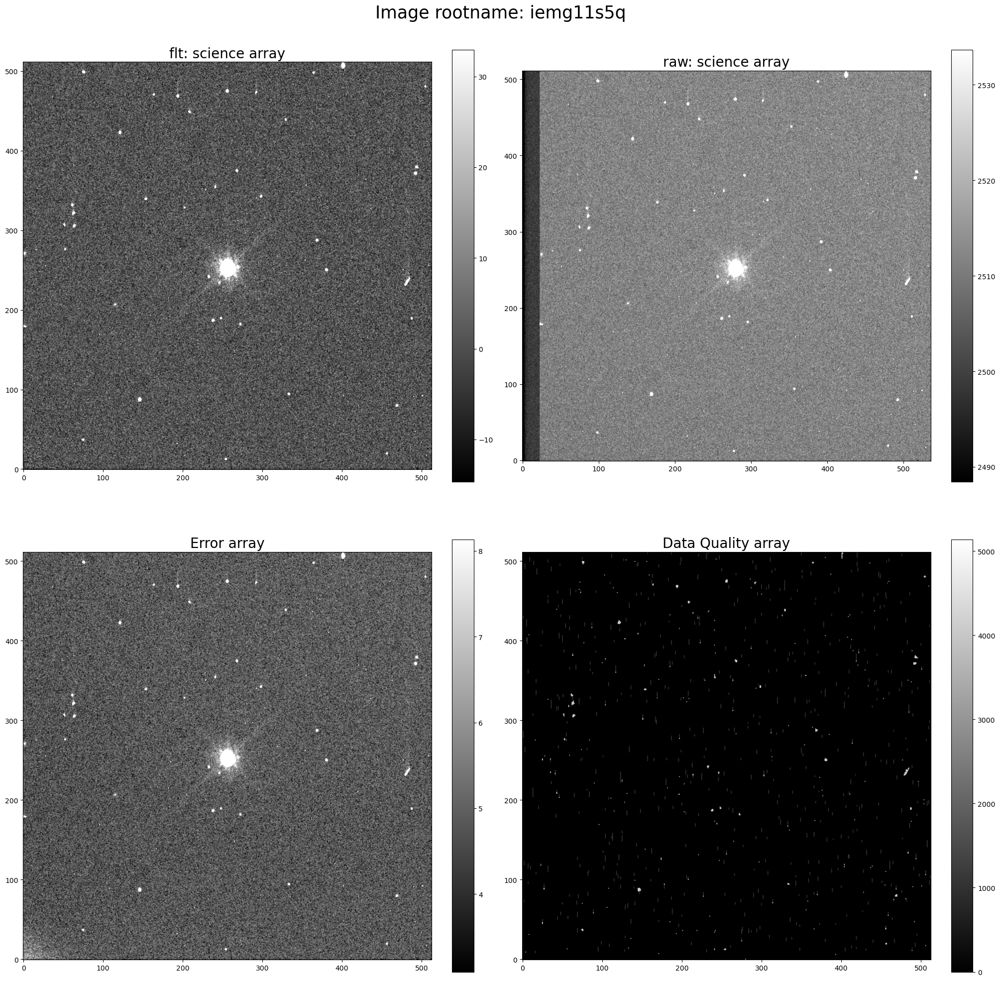

In [5]:
    # Plot the arrays together:
fig1, ax1 = plt.subplots(2,2, figsize=[20,20], constrained_layout=True)

fig1.suptitle('Image rootname: iemg11s5q', fontsize=25)
ax1[0,0].set_title('flt: science array',fontsize=20)
E1a = ax1[0,0].imshow(Ex1_flt, vmin=vmin1_flt, vmax=vmax1_flt, cmap='gray', origin='lower')
fig1.colorbar(E1a, ax = ax1[0,0], shrink=0.9)

ax1[0,1].set_title('raw: science array',fontsize=20)
E1b = ax1[0,1].imshow(Ex1_raw, vmin=vmin1_raw, vmax=vmax1_raw, cmap='gray', origin='lower')
fig1.colorbar(E1b, ax = ax1[0,1], shrink=0.9)

ax1[1,0].set_title("Error array",fontsize=20)
E1c = ax1[1,0].imshow(Ex1_ERR, vmin=vmin1_ERR,vmax=vmax1_ERR, cmap='gray', origin='lower')
fig1.colorbar(E1c, ax = ax1[1,0], shrink=0.9)

ax1[1,1].set_title("Data Quality array",fontsize=20)
E1d = ax1[1,1].imshow(Ex1_DQ, cmap='gray', origin='lower')
fig1.colorbar(E1d, ax = ax1[1,1], shrink=0.9)

plt.savefig('Exercise 1_i plot.png')

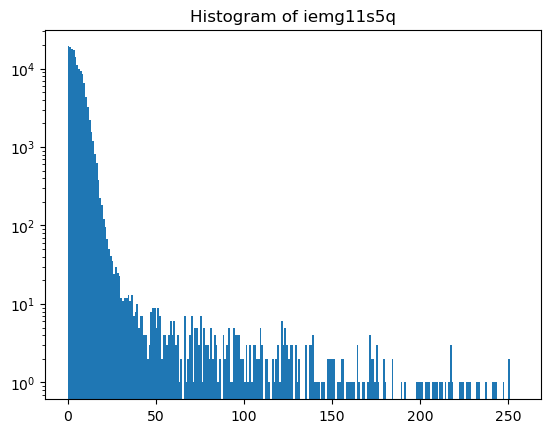

In [6]:
    # Histogram plot:
H1, bins1 = np.histogram(Ex1_flt, 256, [0,256])

plt.figure()
plt.title('Histogram of iemg11s5q')
plt.hist(bins1[:-1], bins1, weights=H1, log=True)
plt.savefig('Ex1i histogram.png')
plt.show()


### Exercise 1.ii:

In [3]:
    # Query the data files:
Ex2_table = Observations.query_criteria(obs_id='iem406a5q')
Ex2_Prods = Observations.get_product_list('71366427')
Ex2Prod = Observations.filter_products(Ex2_Prods, extension=["_flt.fits", "_raw.fits"])
Ex2Prod

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level
str8,str3,str5,str35,str62,str1,str67,str9,str28,str11,str1,str7,str19,str5,str50,int64,str8,str6,int64
71366613,HST,image,hst_16588_06_wfc3_ir_f160w_iem406a5,HAP flat-field product,D,mast:HST/product/hst_16588_06_wfc3_ir_f160w_iem406a5_flt.fits,SCIENCE,--,FLT,--,HAP-SVM,DrizzlePac 3.5.1,16588,hst_16588_06_wfc3_ir_f160w_iem406a5_flt.fits,16580160,71366427,PUBLIC,2
71366427,HST,image,iem406a5q,DADS RAW file - Raw exposure COS/NICMOS/STIS/WFC3/ACS,S,mast:HST/product/iem406a5q_raw.fits,SCIENCE,--,RAW,--,CALWF3,--,16588,iem406a5q_raw.fits,25525440,71366427,PUBLIC,1
71366427,HST,image,iem406a5q,DADS FLT file - Calibrated exposure ACS/WFC3/STIS/COS,S,mast:HST/product/iem406a5q_flt.fits,SCIENCE,Minimum Recommended Products,FLT,--,CALWF3,3.6.2 (May-27-2021),16588,iem406a5q_flt.fits,16568640,71366427,PUBLIC,2


In [3]:
#Download the data:
Observations.download_products(Ex2Prod, mrp_only=False, cache=False)

# Retrieve and separate the data from the files:
Ex2_flt = fits.getdata('mastDownload/HST/iem406a5q/iem406a5q_flt.fits','sci',1)

Ex2_ERR = fits.getdata('mastDownload/HST/iem406a5q/iem406a5q_flt.fits','ERR',1)

Ex2_DQ = fits.getdata('mastDownload/HST/iem406a5q/iem406a5q_flt.fits','DQ',1)

Ex2_raw = fits.getdata('mastDownload/HST/iem406a5q/iem406a5q_raw.fits', 'sci',1)


NameError: name 'Ex2Prod' is not defined

In [5]:
# Get summary values from SCI array:
im2_mean = np.mean(Ex2_flt)
im2_med = np.median(Ex2_flt)
im2_min = np.amin(Ex2_flt)
im2_max = np.amax(Ex2_flt)
im2_stdev = np.std(Ex2_flt)

# Add them to a list
Ex2_stats = ['1.ii',im2_mean, im2_med, im2_min, im2_max, im2_stdev]

# zscale the arrays:
vmin2_flt, vmax2_flt = zscale(Ex2_flt)
vmin2_raw, vmax2_raw = zscale(Ex2_raw)
vmin2_ERR, vmax2_ERR = zscale(Ex2_ERR)

DQ_scale = np.bitwise_and(Ex2_DQ, 256) 



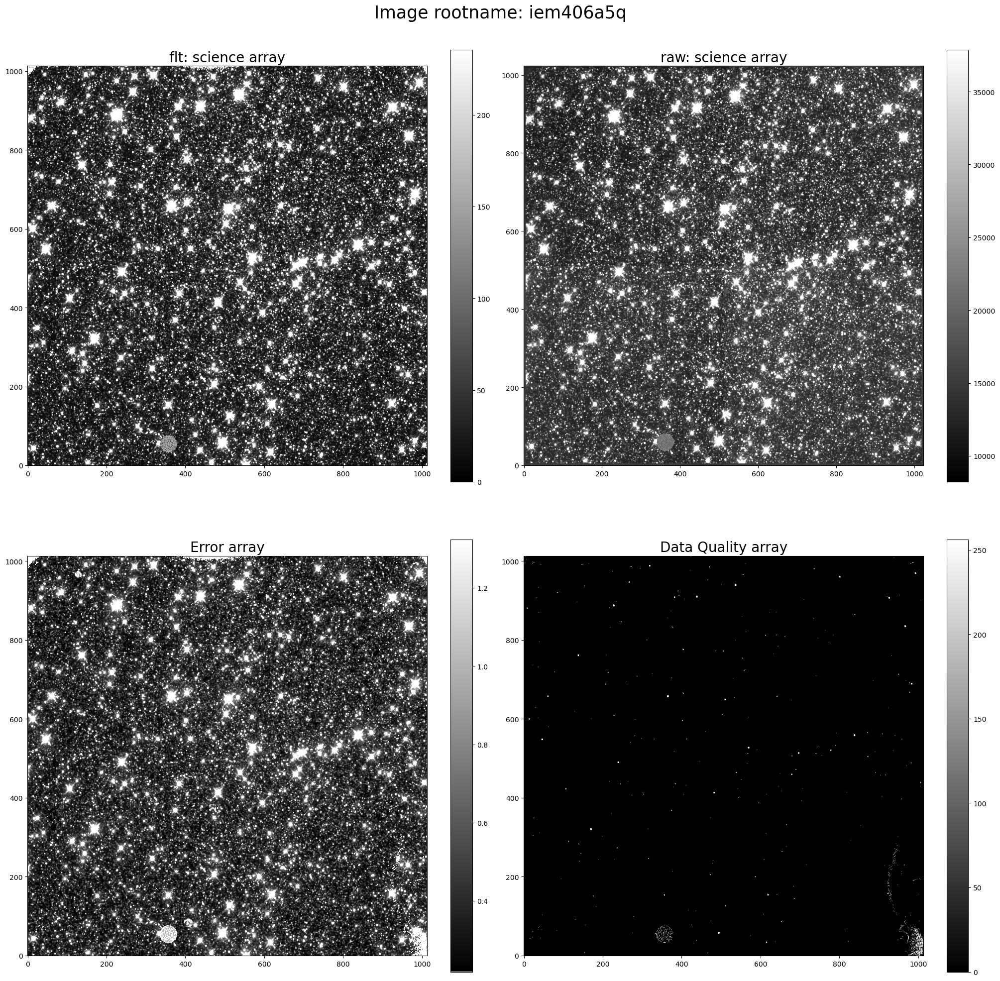

In [7]:
    # Plot the arrays:
fig2, ax2 = plt.subplots(2,2, figsize=[20,20], constrained_layout=True)

fig2.suptitle('Image rootname: iem406a5q', fontsize=25)
ax2[0,0].set_title('flt: science array',fontsize=20)
E2a = ax2[0,0].imshow(Ex2_flt, vmin=vmin2_flt, vmax=vmax2_flt, cmap='gray', origin='lower')
fig2.colorbar(E2a, ax = ax2[0,0], shrink=0.9)

ax2[0,1].set_title('raw: science array',fontsize=20)
E2b = ax2[0,1].imshow(Ex2_raw, vmin=vmin2_raw, vmax=vmax2_raw, cmap='gray', origin='lower')
fig2.colorbar(E2b, ax = ax2[0,1], shrink=0.9)

ax2[1,0].set_title("Error array",fontsize=20)
E2c = ax2[1,0].imshow(Ex2_ERR, vmin=vmin2_ERR,vmax=vmax2_ERR, cmap='gray', origin='lower')
fig2.colorbar(E2c, ax = ax2[1,0], shrink=0.9)

ax2[1,1].set_title("Data Quality array",fontsize=20)
E2d = ax2[1,1].imshow(DQ_scale, cmap='gray', origin='lower')
fig2.colorbar(E2d, ax = ax2[1,1], shrink=0.9)

#plt.savefig('Exercise 1_ii plot.png')

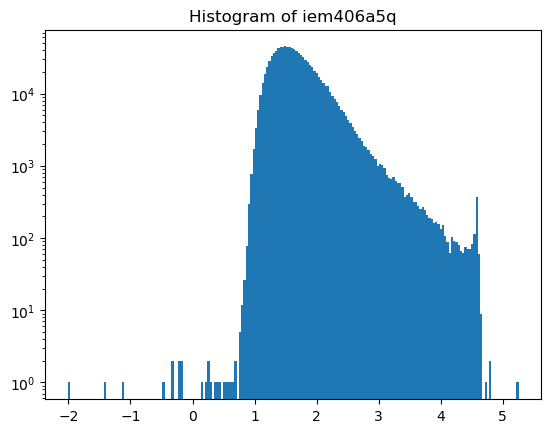

In [71]:
# log scale the data:
mask = Ex2_flt > 0
data_pos = Ex2_flt[mask]
log_data = np.log10(data_pos)
D = log_data.flatten()
R1 = np.amin(D)
R2 = np.amax(D)

# Histogram plot:
#H2, bins2 = np.histogram(Ex2_flt, 500)
plt.figure()
plt.title('Histogram of iem406a5q')
plt.hist(D,bins=200) #range=(R1,R2)) 
#plt.hist(Ex2_flt.flatten(), bins= 200) #range = (vmin2_flt,vmax2_flt))
#plt.xscale('log')
plt.yscale('log')

#plt.savefig('Ex1_ii histogram.png')

### Exercise 1.iii: 'idxr01z3q'

In [20]:
    # Query data files
Ex3_table = Observations.query_criteria(obs_id= 'idxr01*', filters='F555W')
Ex3_Prods = Observations.get_product_list('26262836')
Ex3Prod = Observations.filter_products(Ex3_Prods, extension=["_flt.fits", "_raw.fits"])
Ex3Prod

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level
str8,str3,str5,str37,str62,str1,str69,str9,str28,str11,str1,str7,str19,str5,str52,int64,str8,str6,int64
26262836,HST,image,idxr01z3q,DADS RAW file - Raw exposure COS/NICMOS/STIS/WFC3/ACS,S,mast:HST/product/idxr01z3q_raw.fits,SCIENCE,--,RAW,--,CALWF3,--,15654,idxr01z3q_raw.fits,34891200,26262836,PUBLIC,1
26262836,HST,image,idxr01z3q,DADS FLT file - Calibrated exposure ACS/WFC3/STIS/COS,S,mast:HST/product/idxr01z3q_flt.fits,SCIENCE,Minimum Recommended Products,FLT,--,CALWF3,3.6.2 (May-27-2021),15654,idxr01z3q_flt.fits,168451200,26262836,PUBLIC,2


In [22]:
    # Download the files:
Observations.download_products(Ex3Prod,  mrp_only=False, cache=False)


Local Path,Status,Message,URL
str47,str5,str135,str85
./mastDownload/HST/idxr01z3q/idxr01z3q_raw.fits,ERROR,HTTPError: 502 Server Error: Bad Gateway for url: https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/idxr01z3q_raw.fits,https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/idxr01z3q_raw.fits
./mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits,ERROR,HTTPError: 502 Server Error: Bad Gateway for url: https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/idxr01z3q_flt.fits,https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/idxr01z3q_flt.fits


In [4]:


    # Retrieve data from the files and create arrays
            # flt file data: (SCI array)
data1_flt = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits', 'sci', 1)
data2_flt = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits', 'sci', 2)
Ex3_flt = np.concatenate((data1_flt, data2_flt))

            # Raw file data: (SCI array)
data1_raw = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_raw.fits', 'sci', 1)
data2_raw = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_raw.fits', 'sci', 2)
Ex3_raw= np.concatenate((data1_raw, data2_raw))

            # ERR array from flt file
data1_ERR = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits','ERR',1)
data2_ERR = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits','ERR',2)
Ex3_ERR = np.concatenate((data1_ERR,data2_ERR))

            # DQ array from the flt file
data1_DQ = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits','DQ',1)
data2_DQ = fits.getdata('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits','DQ',2)
Ex3_DQ = np.concatenate((data1_DQ,data2_DQ))


In [7]:
tes1 = fits.getval('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits', 'detector')

test2 = fits.getval('mastDownload/HST/idxr01z3q/idxr01z3q_flt.fits', 'subarray')

#tes1

test2

False

In [24]:
            #Scaling for the plots:
vmin3_flt, vmax3_flt = zscale(Ex3_flt)
vmin3_raw, vmax3_raw = zscale(Ex3_raw)
vmin3_ERR, vmax3_ERR = zscale(Ex3_ERR)

            # Summary statistics:
im3_mean = np.mean(Ex3_flt)
im3_med = np.median(Ex3_flt)
im3_min = np.amin(Ex3_flt)
im3_max = np.amax(Ex3_flt)
im3_stdev = np.std(Ex3_flt)

Ex3_stats = ['1.iii',im3_mean, im3_med, im3_min, im3_max, im3_stdev]

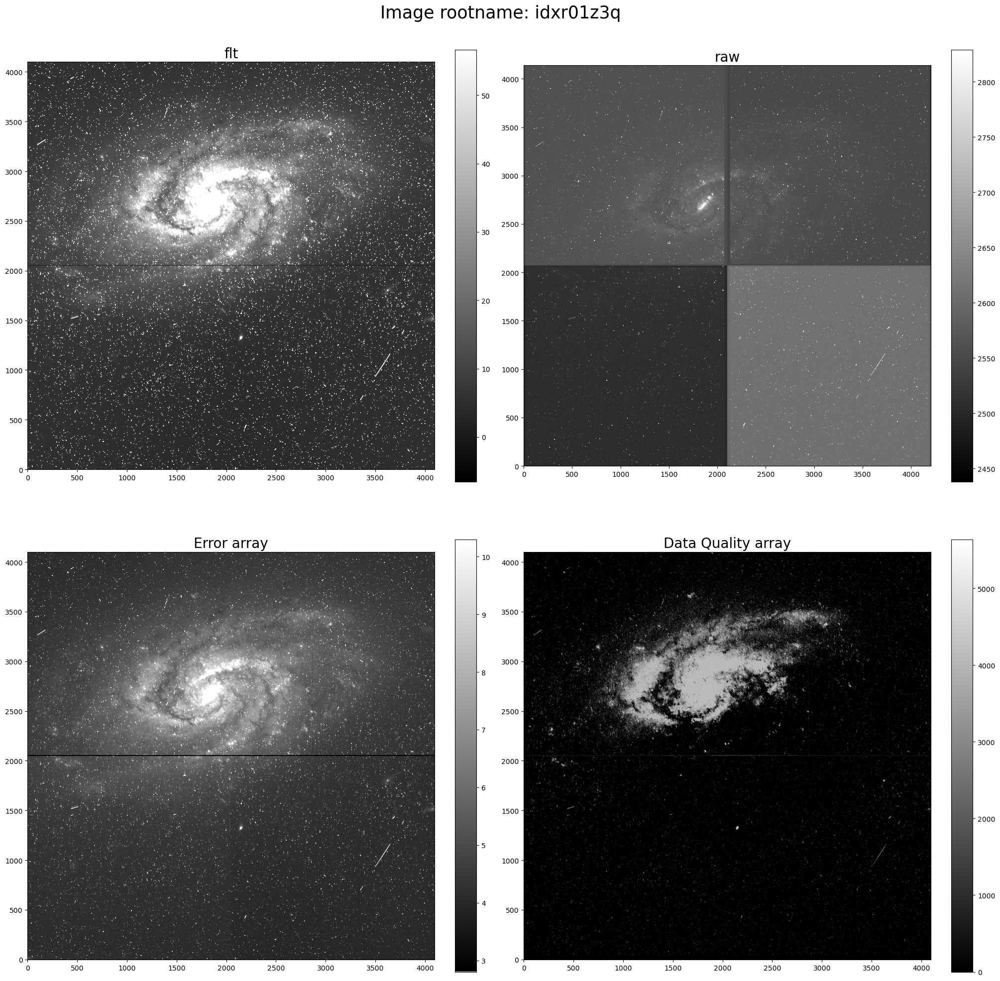

In [25]:

    # Plot the arrays:
fig3, ax3 = plt.subplots(2,2, figsize=[20,20], constrained_layout=True)
fig3.suptitle('Image rootname: idxr01z3q', fontsize=25)

ax3[0,0].set_title('flt',fontsize=20)
E3a = ax3[0,0].imshow(Ex3_flt, vmin=vmin3_flt, vmax=vmax3_flt, cmap='gray', origin='lower')
fig3.colorbar(E3a, ax = ax3[0,0], shrink=0.9)

ax3[0,1].set_title('raw',fontsize=20)
E3b = ax3[0,1].imshow(Ex3_raw, vmin=vmin3_raw, vmax=vmax3_raw, cmap='gray', origin='lower')
fig3.colorbar(E3b, ax = ax3[0,1], shrink=0.9)

ax3[1,0].set_title("Error array",fontsize=20)
E3c = ax3[1,0].imshow(Ex3_ERR, vmin=vmin3_ERR,vmax=vmax3_ERR, cmap='gray', origin='lower')
fig3.colorbar(E3c, ax = ax3[1,0], shrink=0.9)

ax3[1,1].set_title("Data Quality array",fontsize=20)
E3d = ax3[1,1].imshow(Ex3_DQ, cmap='gray', origin='lower')
fig3.colorbar(E3d, ax = ax3[1,1], shrink=0.9)

plt.savefig('Exercise 1_iii plots.png')

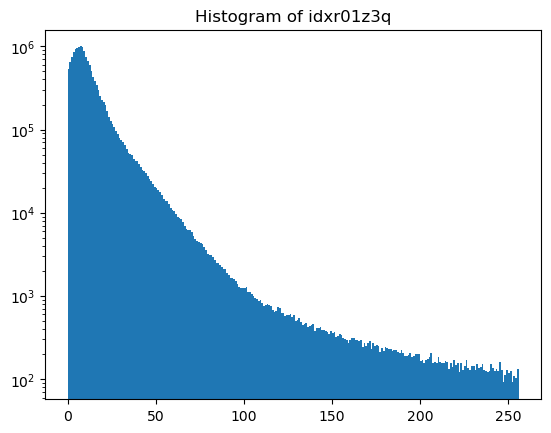

In [17]:
    # Histogram plot:
H3, bins3 = np.histogram(Ex3_flt, 256, [0,256]) #, range=(vmin3_flt,vmax3_flt))
plt.figure()
plt.title('Histogram of idxr01z3q')
plt.hist(bins3[:-1], bins3, weights=H3, log=True)

plt.savefig('ex1_iii histogram.png')

### Exercise 2: 'ie8d07wcq'

In [18]:
# Exercise 2: 
    # Query for the data files
Ex4_table = Observations.query_criteria(obs_id= 'ie8d01neq')
Ex4_Prods = Observations.get_product_list(Ex4_table)
Ex4Prod = Observations.filter_products(Ex4_Prods, extension=["_flt.fits", "_raw.fits"])
Ex4Prod

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level
str8,str3,str5,str9,str64,str1,str40,str9,str28,str8,str1,str6,str19,str5,str23,int64,str8,str6,int64
26281529,HST,image,ie8d01neq,DADS RAW file - Raw exposure COS/NICMOS/STIS/WFC3/ACS,S,mast:HST/product/ie8d01neq_raw.fits,SCIENCE,--,RAW,--,CALWF3,--,16053,ie8d01neq_raw.fits,8527680,26281529,PUBLIC,1
26281529,HST,image,ie8d01neq,DADS FLT file - Calibrated exposure ACS/WFC3/STIS/COS,S,mast:HST/product/ie8d01neq_flt.fits,SCIENCE,Minimum Recommended Products,FLT,--,CALWF3,3.6.2 (May-27-2021),16053,ie8d01neq_flt.fits,42203520,26281529,PUBLIC,2


In [19]:
    # Download data files:
Observations.download_products(Ex4Prod, mrp_only=False, cache=False)

#Retrieve data from the files and separate them:

            #flt file data: (SCI array)
Ex4_flt = fits.getdata('mastDownload/HST/ie8d01neq/ie8d01neq_flt.fits', 'sci', 1)

            #Raw file data: (SCI array)
Ex4_raw = fits.getdata('mastDownload/HST/ie8d01neq/ie8d01neq_raw.fits', 'sci', 1)

            #Get the error array from flt
Ex4_ERR = fits.getdata('mastDownload/HST/ie8d01neq/ie8d01neq_flt.fits','ERR',1)

            #Get the DQ array from the flt file
Ex4_DQ = fits.getdata('mastDownload/HST/ie8d01neq/ie8d01neq_flt.fits','DQ',1)


In [20]:
            #Scaling for the plots:
vmin4_flt, vmax4_flt = zscale(Ex4_flt)
vmin4_raw, vmax4_raw = zscale(Ex4_raw)
vmin4_ERR, vmax4_ERR = zscale(Ex4_ERR)

            #Summary statistics:
im4_mean = np.mean(Ex4_flt)
im4_med = np.median(Ex4_flt)
im4_min = np.amin(Ex4_flt)
im4_max = np.amax(Ex4_flt)
im4_stdev = np.std(Ex4_flt)

Ex4_stats = ['2', im4_mean, im4_med, im4_min, im4_max, im4_stdev]

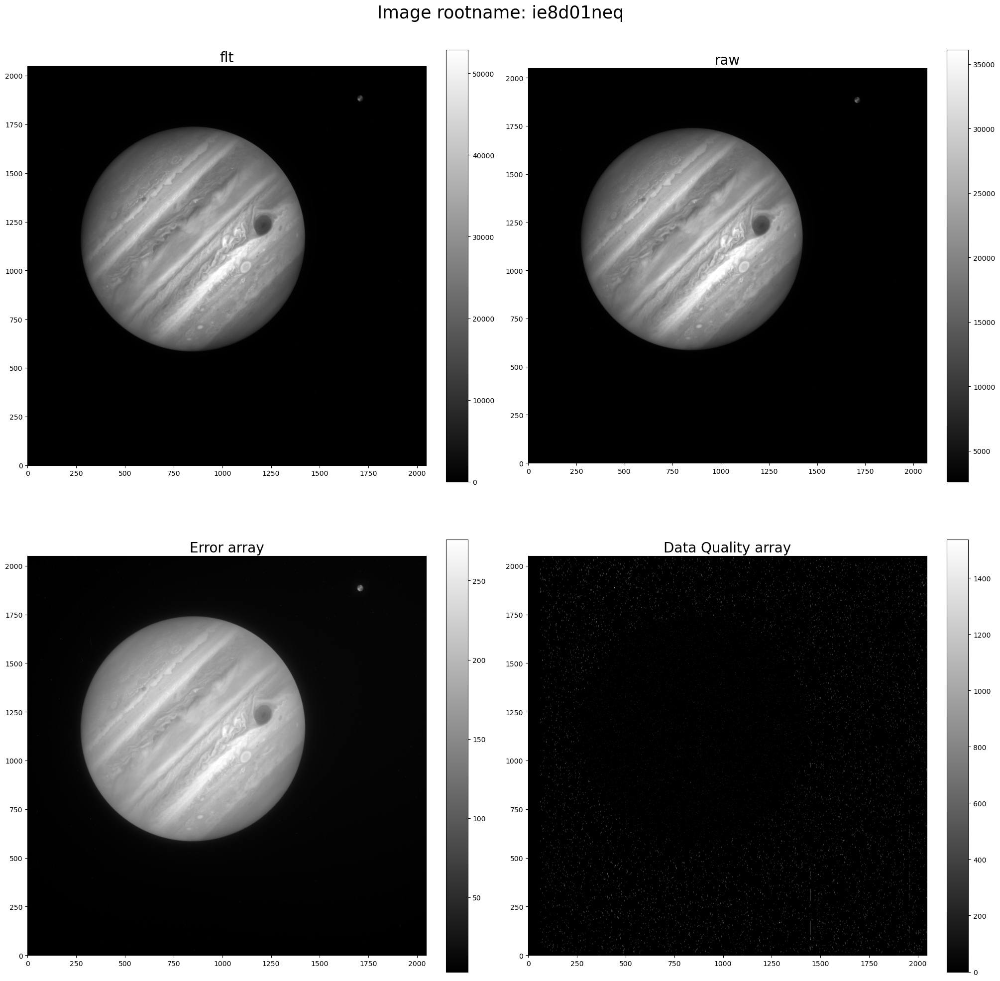

In [21]:
    # Plot the arrays:
fig4, ax4 = plt.subplots(2,2, figsize=[20,20], constrained_layout=True)
fig4.suptitle('Image rootname: ie8d01neq', fontsize=25)

ax4[0,0].set_title('flt',fontsize=20)
E4a = ax4[0,0].imshow(Ex4_flt, vmin=vmin4_flt, vmax=vmax4_flt, cmap='gray', origin='lower')
fig4.colorbar(E4a, ax = ax4[0,0], shrink=0.9)

ax4[0,1].set_title('raw',fontsize=20)
E4b = ax4[0,1].imshow(Ex4_raw, vmin=vmin4_raw, vmax=vmax4_raw, cmap='gray', origin='lower')
fig4.colorbar(E4b, ax = ax4[0,1], shrink=0.9)

ax4[1,0].set_title("Error array",fontsize=20)
E4c = ax4[1,0].imshow(Ex4_ERR, vmin=vmin4_ERR,vmax=vmax4_ERR, cmap='gray', origin='lower')
fig4.colorbar(E4c, ax = ax4[1,0], shrink=0.9)

ax4[1,1].set_title("Data Quality array",fontsize=20)
E4d = ax4[1,1].imshow(Ex4_DQ, cmap='gray', origin='lower')
fig4.colorbar(E4d, ax = ax4[1,1], shrink=0.9)

plt.savefig('Exercise 2 plots.png')

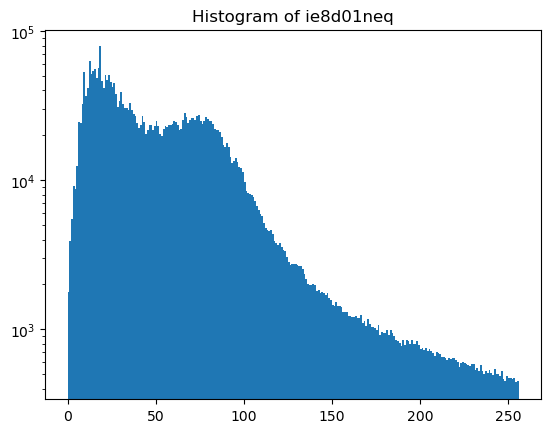

In [22]:
    # Histogram plot:
H4, bins4 = np.histogram(Ex4_flt, 256, [0,256])
plt.figure()
plt.title('Histogram of ie8d01neq')
plt.hist(bins4[:-1], bins4, weights=H4, log=True)
plt.savefig('ex2 histogram.png')

### Create the Pandas dataframe:

In [23]:
# List of each stats list
sum_stats = [Ex1_stats, Ex2_stats, Ex3_stats, Ex4_stats]

# Make the dataframe from these lists
col_names = ['Exercise', 'Mean', 'Median', 'Minimum', 'Maximum', 'Standard Deviation']
stats = pd.DataFrame(sum_stats, columns=col_names)

stats

,Exercise,Mean,Median,Minimum,Maximum,Standard Deviation
0,1.i,4.580475,0.894663,-26.094097,75139.937500,374.576294
1,1.ii,146.970657,41.006523,-1789.112305,178941.187500,1190.846191
2,1.iii,14.455916,8.481624,-436.876526,81286.164062,164.196808
3,2,6820.420898,68.043839,-34.626350,56267.792969,12468.369141
